### Import libraries

In [33]:
import os
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [34]:
import shutil
shutil.unpack_archive("dataset_hist_structures 2.zip") # Load dataset

### Plot the sample images from each class/category



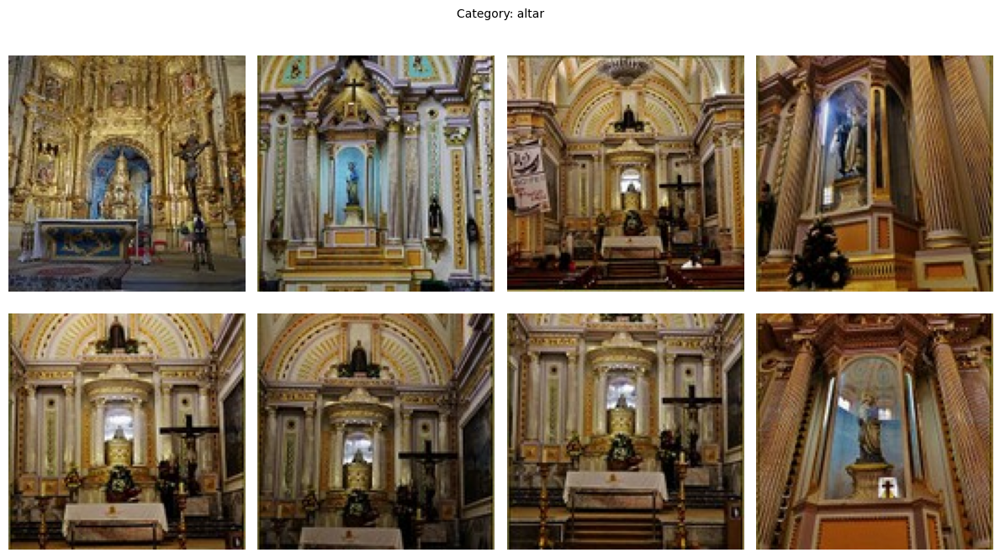


------------------------------------------------------------------------------------------------------------------------------------------------------



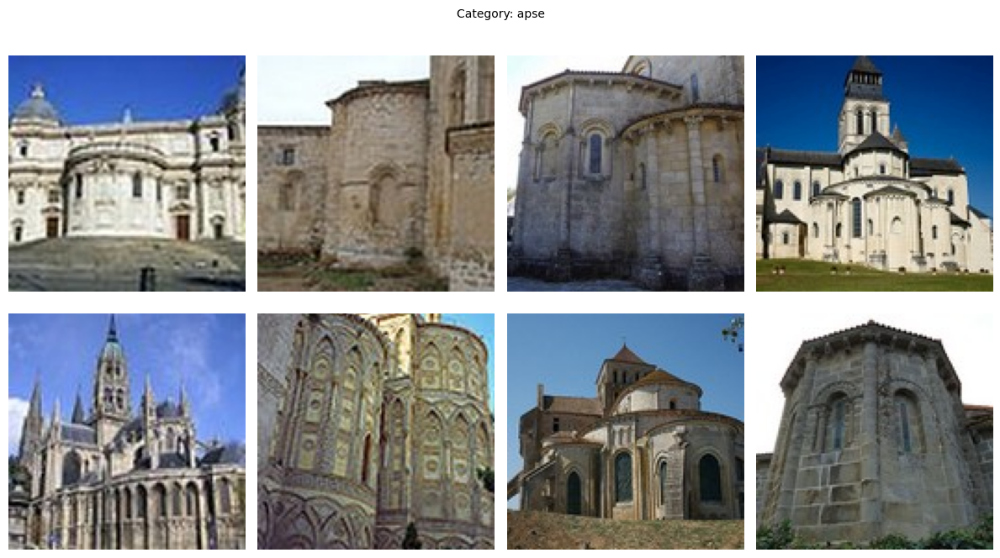


------------------------------------------------------------------------------------------------------------------------------------------------------



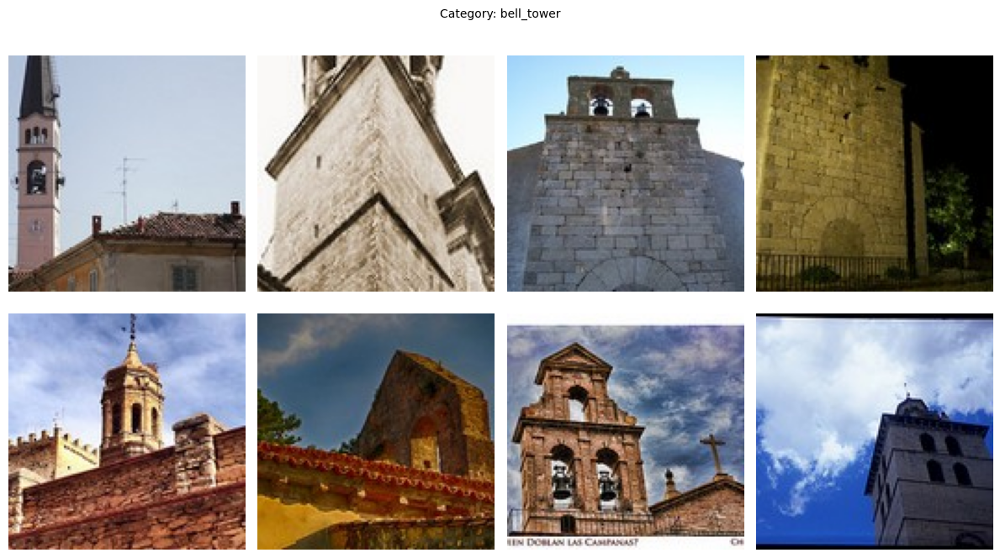


------------------------------------------------------------------------------------------------------------------------------------------------------



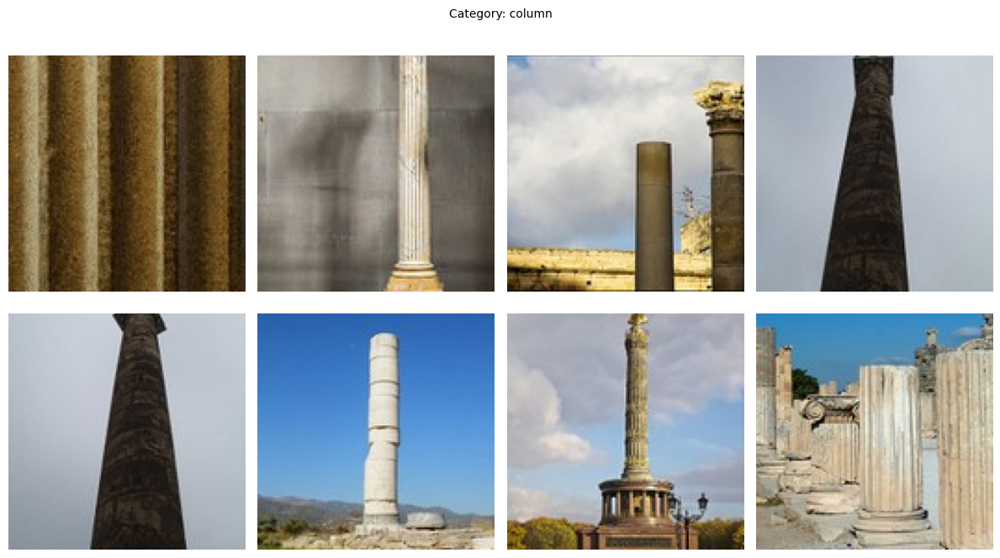


------------------------------------------------------------------------------------------------------------------------------------------------------



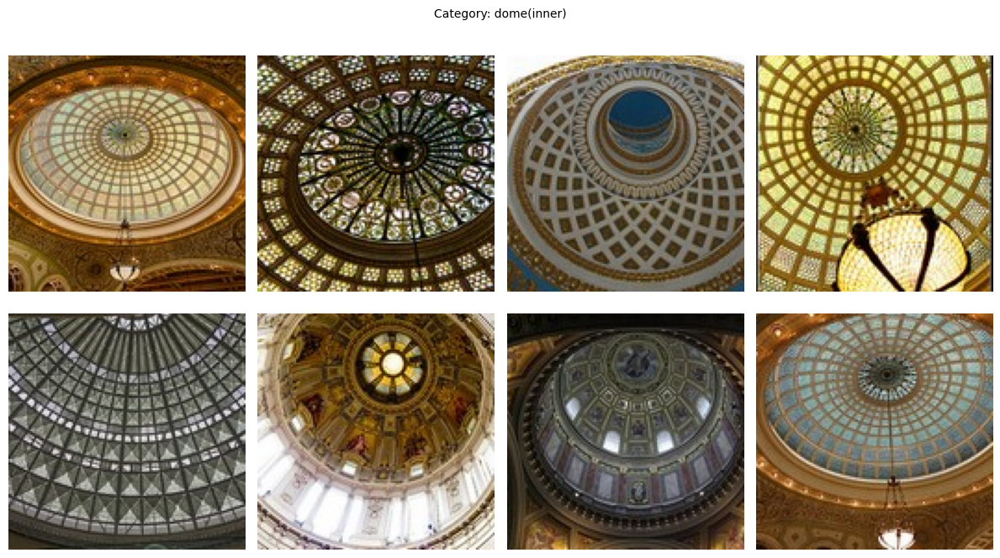


------------------------------------------------------------------------------------------------------------------------------------------------------



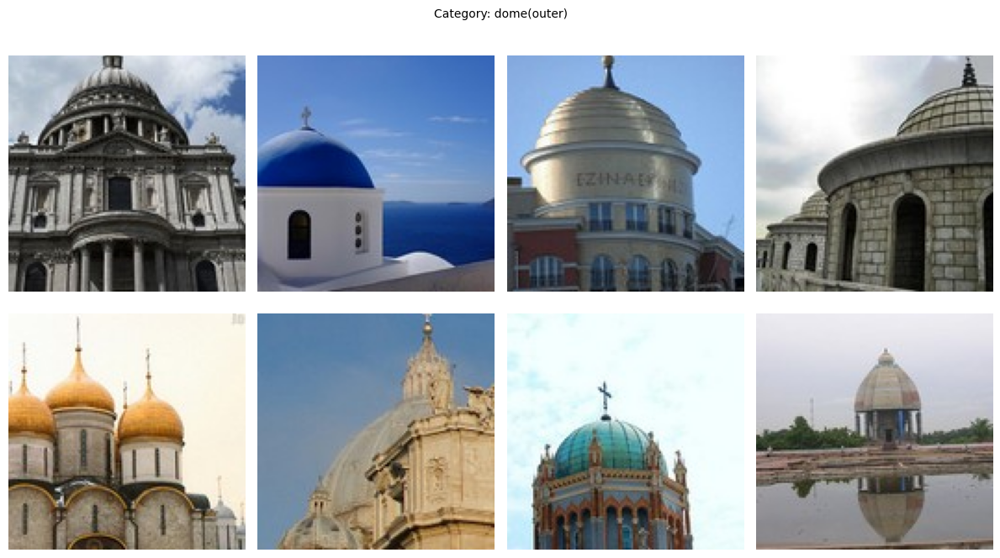


------------------------------------------------------------------------------------------------------------------------------------------------------



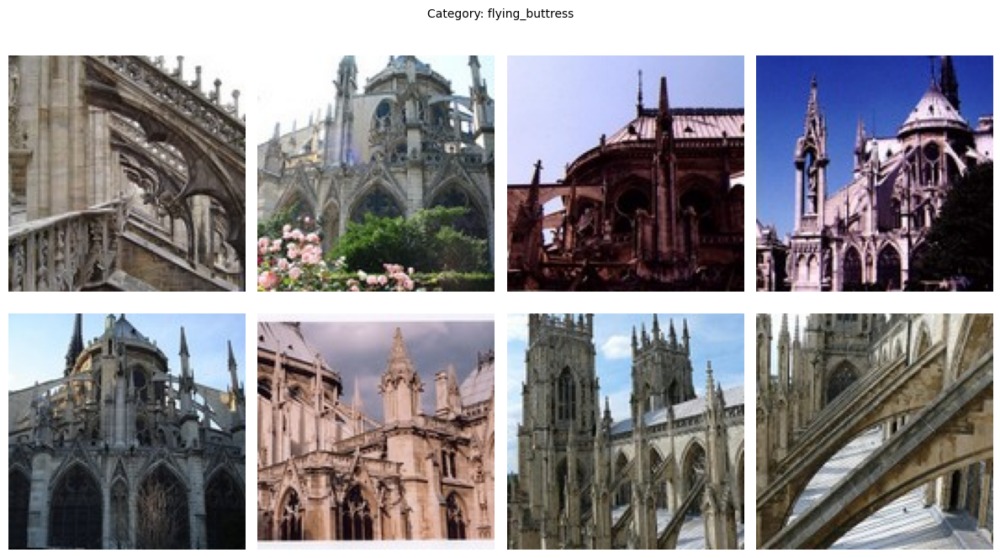


------------------------------------------------------------------------------------------------------------------------------------------------------



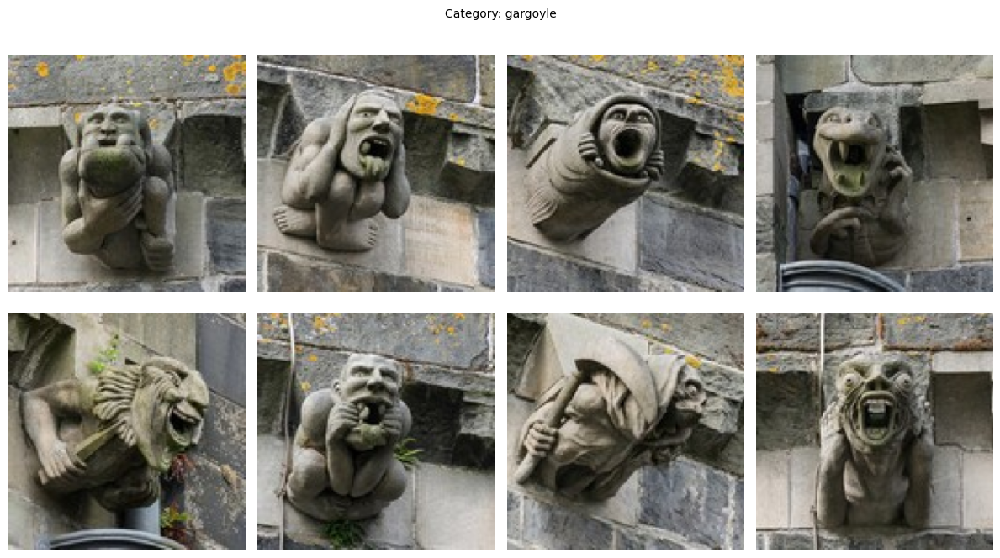


------------------------------------------------------------------------------------------------------------------------------------------------------



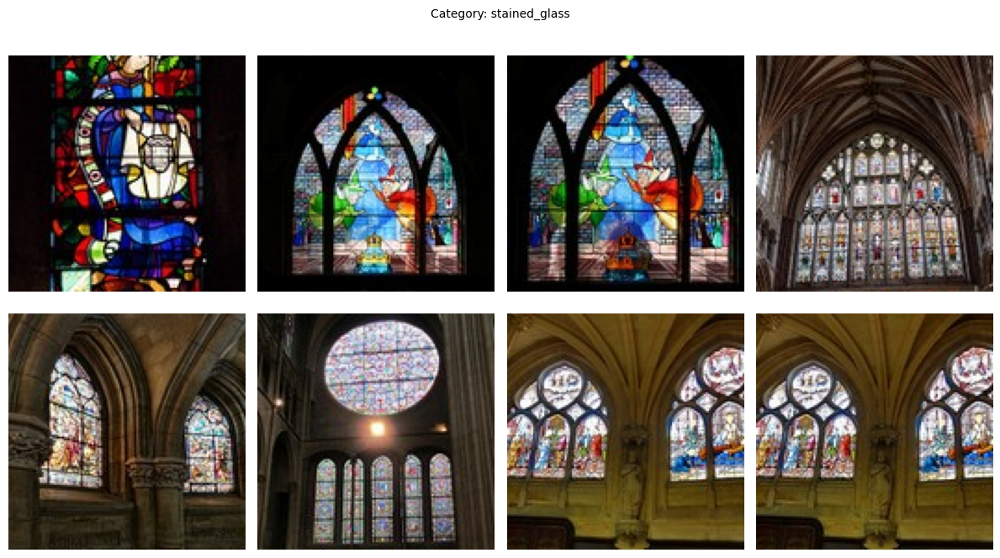


------------------------------------------------------------------------------------------------------------------------------------------------------



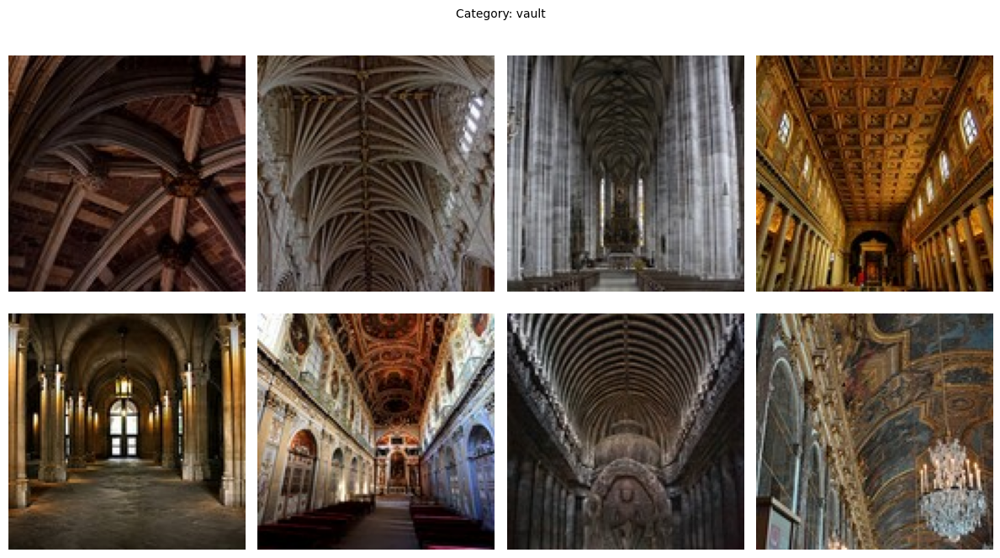


------------------------------------------------------------------------------------------------------------------------------------------------------



In [35]:
data_path = "dataset_hist_structures 2/dataset_hist_structures/Stuctures_Dataset/"

# List all the subdirectories alphabetically
categories = sorted(
    [category for category in os.listdir(data_path) if not category.startswith('.')]
)

# Plot sample images from each category
for category in categories:
    category_path = os.path.join(data_path, category)

    # List images alphabetically
    images = sorted(
        [image for image in os.listdir(category_path) if not image.startswith('.')]
    )

    # Create a new figure for each category
    plt.figure(figsize=(12, 7))
    plt.suptitle(f"Category: {category}", fontsize=10)

    for i in range(min(8, len(images))):
        image_path = os.path.join(category_path, images[i])
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        plt.subplot(2, 4, i + 1)
        plt.imshow(image)
        plt.axis('off')

    # Adjust spacing inside the category
    plt.tight_layout()
    plt.show()

    # -------- GAP BETWEEN CATEGORIES --------
    print("\n" + "-" * 150 + "\n")

### Remove corrupt images

In [36]:
def identify_and_remove_truncated_images(directory):
    for filename in os.listdir(directory):
        filepath = os.path.join(directory, filename)
        if os.path.isfile(filepath):  # Check if it's a file
            try:
                # Attempt to open and load the image
                img = Image.open(filepath)
                img.load()
            except (OSError, IOError) as e:
                print(f"Error processing image {filename}: {str(e)}")
                # Remove the problematic image
                os.remove(filepath)

In [37]:
image_path = "dataset_hist_structures 2/dataset_hist_structures/Stuctures_Dataset/"
for folder in os.listdir(image_path):
    folder_path = os.path.join(image_path, folder)
    if os.path.isdir(folder_path):
      identify_and_remove_truncated_images(folder_path)

image_path = "dataset_hist_structures 2/dataset_hist_structures/Dataset_test/Dataset_test_original_1478/"
for folder in os.listdir(image_path):
    folder_path = os.path.join(image_path, folder)
    if os.path.isdir(folder_path):
      identify_and_remove_truncated_images(folder_path)

Error processing image 0de19007-c9f0-4548-b070-7f67c55443de.jpg: image file is truncated (2 bytes not processed)
Error processing image d90864d8-0ae9-4929-b928-8e30fa7ea93f.jpg: image file is truncated (3 bytes not processed)
Error processing image ren_tmp_jpg.bat: cannot identify image file 'dataset_hist_structures 2/dataset_hist_structures/Dataset_test/Dataset_test_original_1478/bell_tower/ren_tmp_jpg.bat'
Error processing image 9d1de848-bfd8-40e1-9686-0f8aba896655.jpg: cannot identify image file 'dataset_hist_structures 2/dataset_hist_structures/Dataset_test/Dataset_test_original_1478/stained_glass/9d1de848-bfd8-40e1-9686-0f8aba896655.jpg'


### Configure a CNN architecture for transfer learning

In [38]:
# Load the pre-trained model without the top layer
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze all the convolutional layers' weight
for layer in base_model.layers:
    layer.trainable = False

# Add dense layers and dropout for regularization
num_classes= 10 # num_classes is the number of categories

model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [39]:
# Define callback class to stop the training once the validation accuracy reaches a certain number
early_stopping = EarlyStopping(monitor='val_accuracy', patience=3)

### Set up train and test dataset directories and review the number of image samples for train and test set.Train the model without augmentation while continuously monitoring the validation accuracy.

In [40]:
batch_size=128
epochs=2

train_data_dir ="dataset_hist_structures 2/dataset_hist_structures/Stuctures_Dataset/"
validation_data_dir ="dataset_hist_structures 2/dataset_hist_structures/Dataset_test/Dataset_test_original_1478/"

In [41]:
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_data_dir,
        target_size=(224, 224),
        batch_size=batch_size,
        class_mode='categorical')
validation_generator = test_datagen.flow_from_directory(
        validation_data_dir,
        target_size=(224, 224),
        batch_size=batch_size,
        class_mode='categorical')

Found 10235 images belonging to 10 classes.
Found 1473 images belonging to 10 classes.


In [42]:
model.fit(train_generator, epochs=epochs,
          validation_data=validation_generator,
          callbacks=[early_stopping],
          batch_size=batch_size)

Epoch 1/2
80/80 ━━━━━━━━━━━━━━━━━━━━ 76s 915ms/step - accuracy: 0.6175 - loss: 1.6447 - val_accuracy: 0.8642 - val_loss: 0.4203
Epoch 2/2
80/80 ━━━━━━━━━━━━━━━━━━━━ 50s 628ms/step - accuracy: 0.8914 - loss: 0.3478 - val_accuracy: 0.8737 - val_loss: 0.3903


### Train model with augmentation and keep monitoring validation accuracy

In [43]:
train_datagen_aug = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

train_generator_aug = train_datagen_aug.flow_from_directory(
        train_data_dir,
        target_size=(224, 224),
        batch_size=batch_size,
        class_mode='categorical')

history=model.fit(train_generator_aug, epochs=epochs, validation_data=validation_generator, callbacks=[early_stopping])

Found 10235 images belonging to 10 classes.
Epoch 1/2
80/80 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - accuracy: 0.7903 - loss: 0.6810 - val_accuracy: 0.8846 - val_loss: 0.3487
Epoch 2/2
80/80 ━━━━━━━━━━━━━━━━━━━━ 141s 2s/step - accuracy: 0.8226 - loss: 0.5410 - val_accuracy: 0.8697 - val_loss: 0.3870


### Visualize training and validation accuracy on y-axis against each epoch on the x-axis to see if the model overfits after a certain epoch

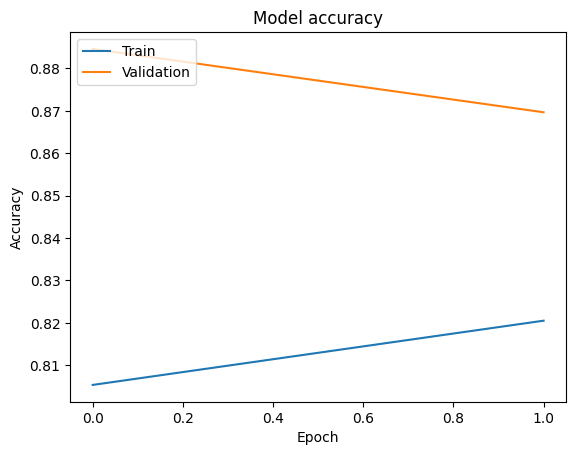

In [44]:
# 'history' is the variable storing the training history
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()